In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.optim.lr_scheduler import LambdaLR
from torch.utils.data import Dataset, DataLoader

import torchvision.transforms.functional as TF
from torchvision import transforms
from torchvision.datasets import Kitti
import torchvision.models as models
from torchvision.ops import nms

import os, copy, time
import numpy as np
import random
from typing import Dict, List, Tuple, Optional, Callable
import argparse
from tqdm import tqdm

import matplotlib.pyplot as plt
from PIL import Image, ImageDraw

print('슝=3')

슝=3


In [2]:
DATA_DIR = os.path.join(os.getenv("HOME"), "work/object_detection/data")  # 여기 아래에 Kitti/raw/... 구조가 생김

transform = transforms.Compose([
    transforms.ToTensor(),   # PIL → torch.Tensor [0, 1]
])

def target_transform(target):
    # 입력된 label 정보를 변환하기 위한 기능
    # target: list[dict], 각 dict에 keys: type, truncated, occluded, alpha, bbox, dimensions, location, rotation_y
    # 예: 여기서는 일단 그대로 반환
    return target

train_dataset = Kitti(
    root=DATA_DIR,
    train=True,
    transform=transform,
    target_transform=target_transform,  # 필요 없으면 None
    download=True,                      # 한 번만 True면 됨
)
test_dataset = Kitti(
    root=DATA_DIR,
    train=False,
    transform=transform,
    target_transform=None,
    download=False,
)
print("Train data samples: ", len(train_dataset))
print("Test data samples: ", len(test_dataset))
print('슝=3')

Train data samples:  7482
Test data samples:  7518
슝=3


Image index: 4726
------Example------


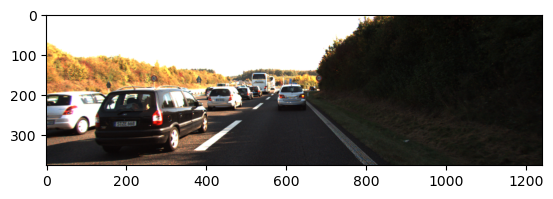

torch.Size([3, 376, 1241])
['type', 'truncated', 'occluded', 'alpha', 'bbox', 'dimensions', 'location', 'rotation_y']

------objects------
[{'type': 'Car', 'truncated': 0.0, 'occluded': 0, 'alpha': -1.56, 'bbox': [578.09, 172.58, 651.82, 239.74], 'dimensions': [1.6, 1.76, 3.84], 'location': [0.17, 1.29, 19.21], 'rotation_y': -1.55}, {'type': 'Car', 'truncated': 0.21, 'occluded': 1, 'alpha': -0.96, 'bbox': [0.0, 190.03, 210.99, 306.21], 'dimensions': [1.49, 1.66, 3.37], 'location': [-8.03, 1.6, 11.26], 'rotation_y': -1.57}, {'type': 'Car', 'truncated': 0.0, 'occluded': 0, 'alpha': -1.17, 'bbox': [110.53, 179.6, 411.59, 358.69], 'dimensions': [1.63, 1.67, 3.92], 'location': [-3.76, 1.57, 8.55], 'rotation_y': -1.57}, {'type': 'Car', 'truncated': 0.0, 'occluded': 2, 'alpha': -1.19, 'bbox': [254.07, 184.77, 366.38, 239.9], 'dimensions': [1.42, 1.61, 4.05], 'location': [-8.57, 1.42, 21.0], 'rotation_y': -1.58}, {'type': 'Car', 'truncated': 0.0, 'occluded': 0, 'alpha': -1.35, 'bbox': [401.48,

In [3]:
idx = random.randint(0, len(train_dataset)-1)   # 한 장의 샘플 데이터를 무작위로 추출합니다.
sample = train_dataset[idx]

print("Image index:", idx)

print('------Example------')
image = sample[0]
img = TF.to_pil_image(image)
plt.imshow(img)
plt.show()
print(np.shape(image))
print(list(sample[1][0].keys()))

print('\n------objects------')
objects = sample[1]
print(objects)

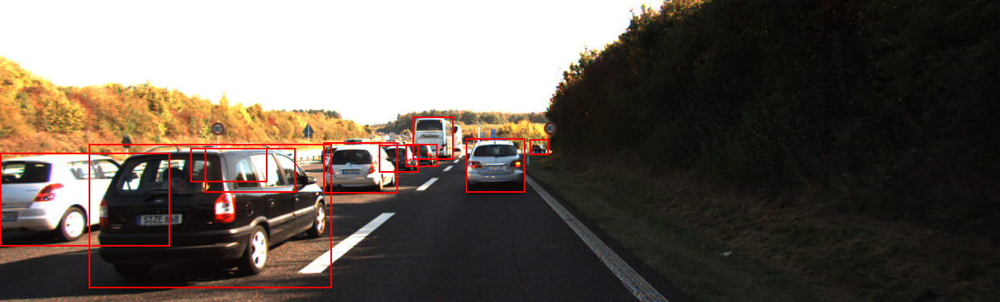

In [4]:
# 이미지 위에 바운딩 박스를 그려 화면에 표시해 주세요.
def visualize_bbox(input_image, objects):
    input_image = copy.deepcopy(input_image)
    draw = ImageDraw.Draw(input_image)

    for _obj in objects:
        # 바운딩 박스 좌표(x_min, x_max, y_min, y_max) 구하기
        height, width, _ = np.shape(input_image)
        x_min, y_min, x_max, y_max = _obj['bbox']
        
        # 바운딩 박스 그리기
        draw.rectangle([x_min, y_min, x_max, y_max], outline=(255,0,0), width=2)

    return input_image

visualize_bbox(img, objects)

In [5]:
class KITTIDataset(Dataset):
    """
    KITTI 객체 탐지 데이터셋
    
    Args:
        img_dir: 이미지 디렉토리 경로
        label_dir: 레이블 디렉토리 경로
        classes: 사용할 클래스 리스트 (None이면 모든 클래스 사용)
        exclude_dontcare: DontCare 객체 제외 여부
    """
    
    # KITTI 데이터셋의 모든 클래스
    ALL_CLASSES = [
        'Car', 'Van', 'Truck', 'Pedestrian', 'Person_sitting', 
        'Cyclist', 'Tram', 'Misc', 'DontCare'
    ]
    
    def __init__(
        self,
        img_dir: str,
        label_dir: str,
        classes: Optional[List[str]] = None,
        exclude_dontcare: bool = True
    ):
        self.img_dir = img_dir
        self.label_dir = label_dir
        self.exclude_dontcare = exclude_dontcare
        
        # 사용할 클래스 설정
        if classes is None:
            self.classes = [c for c in self.ALL_CLASSES if c != 'DontCare']
        else:
            self.classes = classes
            
        # 클래스명 -> 인덱스 매핑 (0부터 시작)
        self.class_to_idx = {cls_name: idx for idx, cls_name in enumerate(self.classes)}
        self.idx_to_class = {idx: cls_name for cls_name, idx in self.class_to_idx.items()}
        
        # 이미지 파일 리스트 가져오기
        self.image_files = self._get_image_files()
        
        print(f"KITTIDataset 초기화 완료:")
        print(f"  - 이미지 개수: {len(self.image_files)}")
        print(f"  - 클래스 개수: {len(self.classes)}")
        print(f"  - 클래스: {self.classes}")
        
    def _get_image_files(self) -> List[str]:
        """이미지 파일 목록을 가져오고 검증합니다."""
        image_files = []
        
        # 이미지 디렉토리의 모든 PNG 파일 찾기
        for fname in sorted(os.listdir(self.img_dir)):
            if fname.endswith('.png') or fname.endswith('.jpg'):
                img_path = os.path.join(self.img_dir, fname)
                label_path = os.path.join(self.label_dir, fname.replace('.png', '.txt').replace('.jpg', '.txt'))
                
                # 이미지와 레이블 모두 존재하는지 확인
                if os.path.exists(img_path) and os.path.exists(label_path):
                    image_files.append(fname)
                else:
                    print(f"경고: {fname}의 레이블 파일이 없습니다.")
                    
        return image_files
    
    def _parse_label(self, label_path: str) -> Tuple[np.ndarray, np.ndarray]:
        """
        레이블 파일을 파싱하여 bbox와 클래스 정보를 추출합니다.
        
        Returns:
            boxes: (N, 4) numpy array of [x_min, y_min, x_max, y_max]
            labels: (N,) numpy array of class indices
        """
        boxes = []
        labels = []
        
        if not os.path.exists(label_path):
            return np.zeros((0, 4), dtype=np.float32), np.zeros((0,), dtype=np.int64)
        
        with open(label_path, 'r') as f:
            for line in f:
                line = line.strip()
                if not line:
                    continue
                    
                parts = line.split()
                if len(parts) < 15:
                    continue
                
                class_name = parts[0]
                
                # DontCare 제외 옵션 처리
                if self.exclude_dontcare and class_name == 'DontCare':
                    continue
                
                # 사용할 클래스에 포함되지 않으면 스킵
                if class_name not in self.class_to_idx:
                    continue
                
                # Bounding box 좌표 (2D bbox)
                try:
                    bbox = [float(parts[4]), float(parts[5]), 
                           float(parts[6]), float(parts[7])]
                    
                    # 유효한 bbox인지 확인
                    if bbox[2] > bbox[0] and bbox[3] > bbox[1]:
                        boxes.append(bbox)
                        labels.append(self.class_to_idx[class_name])
                except (ValueError, IndexError):
                    continue
        
        if len(boxes) == 0:
            return np.zeros((0, 4), dtype=np.float32), np.zeros((0,), dtype=np.int64)
        
        return np.array(boxes, dtype=np.float32), np.array(labels, dtype=np.int64)
    
    def __len__(self) -> int:
        """데이터셋의 크기를 반환합니다."""
        return len(self.image_files)
    
    def __getitem__(self, idx: int) -> Dict:
        """
        인덱스에 해당하는 샘플을 반환합니다.
        
        Returns:
            dict: {
                'image': PIL.Image,
                'boxes': np.ndarray (N, 4),
                'labels': np.ndarray (N,),
                'image_id': str
            }
        """
        # 파일명 가져오기
        fname = self.image_files[idx]
        img_path = os.path.join(self.img_dir, fname)
        label_path = os.path.join(self.label_dir, fname.replace('.png', '.txt').replace('.jpg', '.txt'))
        
        # 이미지 로드
        image = Image.open(img_path).convert('RGB')
        
        # 레이블 파싱
        boxes, labels = self._parse_label(label_path)
        
        # 결과 딕셔너리 생성
        target = {
            'image': image,
            'boxes': boxes,
            'labels': labels,
            'image_id': fname.replace('.png', '').replace('.jpg', '')
        }
        
        return target
    
    def get_class_name(self, idx: int) -> str:
        """클래스 인덱스를 클래스 이름으로 변환합니다."""
        return self.idx_to_class.get(idx, 'Unknown')
    
    def get_num_classes(self) -> int:
        """클래스 개수를 반환합니다 (배경 제외)."""
        return len(self.classes)

In [6]:
class RandomHorizontalFlip:
    """랜덤 좌우 반전 + bbox 좌표 조정."""
    
    def __init__(self, p=0.5):
        self.p = p
    
    def __call__(self, image, target):
        if random.random() < self.p:
            # 이미지가 PIL인지 Tensor인지 확인
            if isinstance(image, Image.Image):
                image = TF.hflip(image)
                width, _ = image.size
            else:  # Tensor
                image = TF.hflip(image)
                _, _, width = image.shape
            
            # Bounding box 좌표 변환
            boxes = target['boxes'].copy()
            if len(boxes) > 0:
                boxes[:, [0, 2]] = width - boxes[:, [2, 0]]
                target['boxes'] = boxes
        
        return image, target

class ColorJitter:
    """색상 변환: 밝기, 대비, 채도, 색조 조정."""
    
    def __init__(self, brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1):
        self.brightness = brightness
        self.contrast = contrast
        self.saturation = saturation
        self.hue = hue
    
    def __call__(self, image, target):
        # PIL Image에만 적용 (Tensor 이전에 적용되어야 함)
        if isinstance(image, Image.Image):
            if self.brightness > 0:
                brightness_factor = random.uniform(1 - self.brightness, 1 + self.brightness)
                image = TF.adjust_brightness(image, brightness_factor)
            
            if self.contrast > 0:
                contrast_factor = random.uniform(1 - self.contrast, 1 + self.contrast)
                image = TF.adjust_contrast(image, contrast_factor)
            
            if self.saturation > 0:
                saturation_factor = random.uniform(1 - self.saturation, 1 + self.saturation)
                image = TF.adjust_saturation(image, saturation_factor)
            
            if self.hue > 0:
                hue_factor = random.uniform(-self.hue, self.hue)
                image = TF.adjust_hue(image, hue_factor)
        
        return image, target

In [7]:
class Resize:
    """고정 크기로 리사이즈 + bbox 스케일링."""
    
    def __init__(self, size: Tuple[int, int]):
        """
        Args:
            size: (height, width) tuple
        """
        self.size = size  # (H, W)
    
    def __call__(self, image, target):
        # 원본 크기
        if isinstance(image, Image.Image):
            orig_width, orig_height = image.size
            image = TF.resize(image, self.size)
        else:  # Tensor
            _, orig_height, orig_width = image.shape
            image = TF.resize(image, self.size)
        
        # 스케일 계산
        new_height, new_width = self.size
        scale_y = new_height / orig_height
        scale_x = new_width / orig_width
        
        # Bounding box 스케일링
        boxes = target['boxes'].copy()
        if len(boxes) > 0:
            boxes[:, 0] *= scale_x  # x_min
            boxes[:, 1] *= scale_y  # y_min
            boxes[:, 2] *= scale_x  # x_max
            boxes[:, 3] *= scale_y  # y_max
            target['boxes'] = boxes
        
        return image, target

class RandomCrop:
    """랜덤 크롭 + bbox 클리핑 및 유효성 검증."""
    
    def __init__(self, size: Tuple[int, int], min_area_ratio=0.3):
        """
        Args:
            size: (height, width) 크롭 크기
            min_area_ratio: 크롭 후 최소 면적 비율 (원본 대비)
        """
        self.size = size
        self.min_area_ratio = min_area_ratio
    
    def __call__(self, image, target):
        # 원본 크기
        if isinstance(image, Image.Image):
            orig_width, orig_height = image.size
        else:
            _, orig_height, orig_width = image.shape
        
        crop_height, crop_width = self.size
        
        # 이미지가 크롭 크기보다 작으면 패딩
        if orig_height < crop_height or orig_width < crop_width:
            # 패딩 없이 리사이즈로 처리
            resize_transform = Resize(self.size)
            return resize_transform(image, target)
        
        # 랜덤 크롭 위치
        top = random.randint(0, orig_height - crop_height)
        left = random.randint(0, orig_width - crop_width)
        
        # 이미지 크롭
        if isinstance(image, Image.Image):
            image = TF.crop(image, top, left, crop_height, crop_width)
        else:
            image = TF.crop(image, top, left, crop_height, crop_width)
        
        # Bounding box 조정
        boxes = target['boxes'].copy()
        labels = target['labels'].copy()
        
        if len(boxes) > 0:
            # 크롭 영역으로 좌표 변환
            boxes[:, 0] -= left  # x_min
            boxes[:, 1] -= top   # y_min
            boxes[:, 2] -= left  # x_max
            boxes[:, 3] -= top   # y_max
            
            # 크롭 영역 내로 클리핑
            boxes[:, 0] = np.clip(boxes[:, 0], 0, crop_width)
            boxes[:, 1] = np.clip(boxes[:, 1], 0, crop_height)
            boxes[:, 2] = np.clip(boxes[:, 2], 0, crop_width)
            boxes[:, 3] = np.clip(boxes[:, 3], 0, crop_height)
            
            # 유효한 bbox만 유지 (최소 면적 체크)
            areas = (boxes[:, 2] - boxes[:, 0]) * (boxes[:, 3] - boxes[:, 1])
            orig_areas = (target['boxes'][:, 2] - target['boxes'][:, 0]) * \
                        (target['boxes'][:, 3] - target['boxes'][:, 1])
            
            valid_mask = (boxes[:, 2] > boxes[:, 0]) & \
                        (boxes[:, 3] > boxes[:, 1]) & \
                        (areas >= orig_areas * self.min_area_ratio)
            
            boxes = boxes[valid_mask]
            labels = labels[valid_mask]
        
        target['boxes'] = boxes
        target['labels'] = labels
        
        return image, target


In [8]:
class ToTensor:
    """PIL Image를 Tensor로 변환합니다."""
    
    def __call__(self, image, target):
        image = TF.to_tensor(image)
        return image, target


class Normalize:
    """이미지를 정규화합니다 (ImageNet 평균/표준편차)."""
    
    def __init__(self, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
        self.mean = mean
        self.std = std
    
    def __call__(self, image, target):
        image = TF.normalize(image, mean=self.mean, std=self.std)
        return image, target

In [9]:
class Compose:
    """여러 변환을 순차적으로 적용합니다."""
    
    def __init__(self, transforms: List[Callable]):
        self.transforms = transforms
    
    def __call__(self, image, target):
        for t in self.transforms:
            image, target = t(image, target)
        return image, target

def collate_fn(batch: List[Dict]) -> Tuple[torch.Tensor, List[Dict]]:
    """
    배치 생성을 위한 커스텀 collate 함수.
    이미지 크기가 다를 수 있으므로 리스트로 반환합니다.
    Args:
        batch: 샘플 리스트
    Returns:
        images: (B, C, H, W) Tensor
        targets: 타겟 딕셔너리 리스트
    """
    images = []
    targets = []
    
    for item in batch:
        images.append(item['image'])
        targets.append({
            'boxes': torch.tensor(item['boxes'], dtype=torch.float32),
            'labels': torch.tensor(item['labels'], dtype=torch.int64),
            'image_id': item['image_id']
        })
    
    # 이미지를 스택 (모두 같은 크기여야 함)
    images = torch.stack(images, dim=0)
    return images, targets

class TransformedDataset:
    """Transform을 적용하는 데이터셋 래퍼."""
    
    def __init__(self, dataset: KITTIDataset, transform: Optional[Callable] = None):
        self.dataset = dataset
        self.transform = transform
    
    def __len__(self):
        return len(self.dataset)
    
    def __getitem__(self, idx):
        sample = self.dataset[idx]
        image = sample['image']
        target = {
            'boxes': sample['boxes'],
            'labels': sample['labels'],
            'image_id': sample['image_id']
        }
        
        if self.transform is not None:
            image, target = self.transform(image, target)
        
        return {
            'image': image,
            'boxes': target['boxes'],
            'labels': target['labels'],
            'image_id': target['image_id']
        }

def get_train_transforms(img_size=(600, 800)):
    """훈련용 데이터 변환 파이프라인."""
    return Compose([
        # RandomResize(min_size=580, max_size=620), 필요없는 증강.
        RandomHorizontalFlip(p=0.3),
        ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1),
        Resize(img_size),
        ToTensor(),
        Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

def get_val_transforms(img_size=(600, 800)):
    """검증용 데이터 변환 파이프라인 (증강 없음)."""
    return Compose([
        Resize(img_size),
        ToTensor(),
        Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

In [10]:
def get_train_dataloader(
    img_dir: str,
    label_dir: str,
    batch_size: int = 8,
    num_workers: int = 4,
    img_size: Tuple[int, int] = (600, 800),
    shuffle: bool = True,
    classes: Optional[List[str]] = None
) -> DataLoader:
    """
    훈련용 DataLoader를 생성합니다.
    Args:
        img_dir: 이미지 디렉토리
        label_dir: 레이블 디렉토리
        batch_size: 배치 크기
        num_workers: 워커 프로세스 수
        img_size: 이미지 크기 (height, width)
        shuffle: 셔플 여부
        classes: 사용할 클래스 리스트
    Returns:
        DataLoader
    """
    dataset = KITTIDataset(
        img_dir=img_dir,
        label_dir=label_dir,
        classes=classes,
        exclude_dontcare=True
    )
    
    transformed_dataset = TransformedDataset(
        dataset=dataset,
        transform=get_train_transforms(img_size)
    )
    
    return DataLoader(
        transformed_dataset,
        batch_size=batch_size,
        shuffle=shuffle,
        num_workers=num_workers,
        collate_fn=collate_fn,
        pin_memory=True
    )

def get_val_dataloader(
    img_dir: str,
    label_dir: str,
    batch_size: int = 8,
    num_workers: int = 4,
    img_size: Tuple[int, int] = (600, 800),
    shuffle: bool = False,
    classes: Optional[List[str]] = None
) -> DataLoader:
    """
    검증용 DataLoader를 생성합니다.
    Args:
        img_dir: 이미지 디렉토리
        label_dir: 레이블 디렉토리
        batch_size: 배치 크기
        num_workers: 워커 프로세스 수
        img_size: 이미지 크기 (height, width)
        shuffle: 셔플 여부
        classes: 사용할 클래스 리스트
    Returns:
        DataLoader
    """
    dataset = KITTIDataset(
        img_dir=img_dir,
        label_dir=label_dir,
        classes=classes,
        exclude_dontcare=True
    )
    
    transformed_dataset = TransformedDataset(
        dataset=dataset,
        transform=get_val_transforms(img_size)
    )
    
    return DataLoader(
        transformed_dataset,
        batch_size=batch_size,
        shuffle=shuffle,
        num_workers=num_workers,
        collate_fn=collate_fn,
        pin_memory=True
    )

In [11]:
class AnchorBox:
    """
    RetinaNet을 위한 Anchor Box 생성기
    Args:
        aspect_ratios: Anchor의 가로세로 비율 리스트
        scales: Anchor 크기 스케일 리스트
        areas: 각 피라미드 레벨별 기본 영역
    """
    
    def __init__(
        self,
        aspect_ratios=[0.5, 1.0, 2.0],
        scales=[2 ** 0, 2 ** (1/3), 2 ** (2/3)],
        areas=[32.0**2, 64.0**2, 128.0**2, 256.0**2, 512.0**2]
    ):
        self.aspect_ratios = aspect_ratios
        self.scales = scales
        self.areas = areas
        
        self._num_anchors = len(aspect_ratios) * len(scales)
        self._strides = [2 ** i for i in range(3, 8)]  # [8, 16, 32, 64, 128]
        self._anchor_dims = self._compute_dims()
    
    def _compute_dims(self):
        """각 피라미드 레벨과 aspect ratio/scale 조합별 anchor 크기 계산"""
        anchor_dims_all = []
        
        for area in self.areas:
            anchor_dims = []
            for ratio in self.aspect_ratios:
                anchor_height = torch.sqrt(torch.tensor(area / ratio))
                anchor_width = area / anchor_height
                
                dims = torch.stack([anchor_width, anchor_height], dim=-1)
                dims = dims.unsqueeze(0).unsqueeze(0)
                
                for scale in self.scales:
                    anchor_dims.append(scale * dims)
            
            anchor_dims_all.append(torch.stack(anchor_dims, dim=-2))
        
        return anchor_dims_all
    
    def _get_anchors(self, feature_height, feature_width, level):
        """특정 피라미드 레벨의 anchor boxes 생성"""
        # 그리드 중심점 생성
        rx = torch.arange(feature_width, dtype=torch.float32) + 0.5
        ry = torch.arange(feature_height, dtype=torch.float32) + 0.5
        
        centers = torch.stack(torch.meshgrid(rx, ry, indexing='xy'), dim=-1)
        centers = centers * self._strides[level - 3]
        centers = centers.unsqueeze(-2)
        centers = centers.repeat(1, 1, self._num_anchors, 1)
        
        # Anchor 크기 정보
        dims = self._anchor_dims[level - 3].repeat(feature_height, feature_width, 1, 1)
        
        # [center_x, center_y, width, height] 형식
        anchors = torch.cat([centers, dims], dim=-1)
        return anchors.view(feature_height * feature_width * self._num_anchors, 4)
    
    def get_anchors(self, image_height, image_width):
        """이미지 크기에 대한 모든 피라미드 레벨의 anchors 생성"""
        anchors = [
            self._get_anchors(
                torch.ceil(torch.tensor(image_height / (2 ** i))).int().item(),
                torch.ceil(torch.tensor(image_width / (2 ** i))).int().item(),
                i
            )
            for i in range(3, 8)
        ]
        return torch.cat(anchors, dim=0)

In [12]:
def convert_to_corners(boxes):
    """중심점 형식을 corner 형식으로 변환"""
    return torch.cat(
        [boxes[..., :2] - boxes[..., 2:] / 2.0,
         boxes[..., :2] + boxes[..., 2:] / 2.0],
        dim=-1
    )

def convert_to_xywh(boxes):
    """Corner 형식을 중심점 형식으로 변환"""
    return torch.cat(
        [(boxes[..., :2] + boxes[..., 2:]) / 2.0,
         boxes[..., 2:] - boxes[..., :2]],
        dim=-1
    )

In [13]:
class LabelEncoder:
    """
    Ground truth boxes와 labels를 anchor boxes에 매칭하여 학습용 타겟 생성
    """
    
    def __init__(self, box_variance=[0.1, 0.1, 0.2, 0.2]):
        self._anchor_box = AnchorBox()
        self._box_variance = torch.tensor(box_variance, dtype=torch.float32)
    
    def _compute_iou(self, boxes1, boxes2):
        """IoU 계산 (boxes format: [x_min, y_min, x_max, y_max])"""
        # Intersection
        lu = torch.maximum(boxes1[:, None, :2], boxes2[:, :2])
        rd = torch.minimum(boxes1[:, None, 2:], boxes2[:, 2:])
        intersection = torch.clamp(rd - lu, min=0.0)
        intersection_area = intersection[:, :, 0] * intersection[:, :, 1]
        
        # Areas
        boxes1_area = (boxes1[:, 2] - boxes1[:, 0]) * (boxes1[:, 3] - boxes1[:, 1])
        boxes2_area = (boxes2[:, 2] - boxes2[:, 0]) * (boxes2[:, 3] - boxes2[:, 1])
        
        # Union
        union_area = boxes1_area[:, None] + boxes2_area - intersection_area
        
        return intersection_area / torch.clamp(union_area, min=1e-8)
    
    def _match_anchor_boxes(self, anchor_boxes, gt_boxes, match_iou=0.5, ignore_iou=0.4):
        """Anchor boxes를 ground truth boxes에 매칭"""
        # Convert anchors from [cx, cy, w, h] to [x_min, y_min, x_max, y_max]
        anchor_corners = torch.cat([
            anchor_boxes[:, :2] - anchor_boxes[:, 2:] / 2.0,
            anchor_boxes[:, :2] + anchor_boxes[:, 2:] / 2.0
        ], dim=-1)
        
        iou_matrix = self._compute_iou(anchor_corners, gt_boxes)
        max_iou, matched_gt_idx = torch.max(iou_matrix, dim=1)
        
        positive_mask = max_iou >= match_iou
        negative_mask = max_iou < ignore_iou
        ignore_mask = ~(positive_mask | negative_mask)
        
        return matched_gt_idx, positive_mask.float(), ignore_mask.float()
    
    def _compute_box_target(self, anchor_boxes, matched_gt_boxes):
        """Anchor box와 GT box 간의 offset 계산"""
        # Convert GT boxes to [cx, cy, w, h]
        matched_gt_cxcywh = torch.cat([
            (matched_gt_boxes[:, :2] + matched_gt_boxes[:, 2:]) / 2.0,
            matched_gt_boxes[:, 2:] - matched_gt_boxes[:, :2]
        ], dim=-1)
        
        box_target = torch.cat([
            (matched_gt_cxcywh[:, :2] - anchor_boxes[:, :2]) / anchor_boxes[:, 2:],
            torch.log(matched_gt_cxcywh[:, 2:] / anchor_boxes[:, 2:])
        ], dim=-1)
        
        box_target = box_target / self._box_variance.to(box_target.device)
        
        return box_target
    
    def encode_batch(self, images, batch_boxes, batch_labels):
        """
        배치 데이터를 인코딩
        
        Args:
            images: (B, C, H, W) 이미지
            batch_boxes: List of (N, 4) boxes per image
            batch_labels: List of (N,) labels per image
        
        Returns:
            encoded_labels: (B, num_anchors, 5) encoded targets
        """
        batch_size = images.size(0)
        image_height, image_width = images.size(2), images.size(3)
        
        anchor_boxes = self._anchor_box.get_anchors(image_height, image_width)
        anchor_boxes = anchor_boxes.to(images.device)
        
        encoded_labels = []
        
        for i in range(batch_size):
            gt_boxes = batch_boxes[i].to(images.device)
            cls_ids = batch_labels[i].to(images.device).float()
            
            if len(gt_boxes) == 0:
                # No objects in this image
                label = torch.zeros((len(anchor_boxes), 5), device=images.device)
                label[:, 4] = -1.0  # All negative
                encoded_labels.append(label)
                continue
            
            matched_gt_idx, positive_mask, ignore_mask = self._match_anchor_boxes(
                anchor_boxes, gt_boxes
            )
            
            matched_gt_boxes = gt_boxes[matched_gt_idx]
            box_target = self._compute_box_target(anchor_boxes, matched_gt_boxes)
            
            matched_gt_cls_ids = cls_ids[matched_gt_idx]
            cls_target = torch.where(positive_mask != 1.0, -1.0, matched_gt_cls_ids)
            cls_target = torch.where(ignore_mask == 1.0, -2.0, cls_target)
            
            label = torch.cat([box_target, cls_target.unsqueeze(-1)], dim=-1)
            encoded_labels.append(label)
        
        return torch.stack(encoded_labels, dim=0)

print('슝=3')

슝=3


In [14]:
class FeaturePyramid(nn.Module):
    """
    Feature Pyramid Network
    ResNet 백본에서 추출한 feature maps를 피라미드 구조로 변환
    """
    
    def __init__(self, backbone):
        super(FeaturePyramid, self).__init__()
        self.backbone = backbone
        # 1x1 convolution for lateral connections
        self.conv_c3_1x1 = nn.Conv2d(512, 256, kernel_size=1, stride=1, padding=0)
        self.conv_c4_1x1 = nn.Conv2d(1024, 256, kernel_size=1, stride=1, padding=0)
        self.conv_c5_1x1 = nn.Conv2d(2048, 256, kernel_size=1, stride=1, padding=0)
        # 3x3 convolution for smoothing
        self.conv_c3_3x3 = nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1)
        self.conv_c4_3x3 = nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1)
        self.conv_c5_3x3 = nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1)
        # Extra layers for P6, P7
        self.conv_c6_3x3 = nn.Conv2d(2048, 256, kernel_size=3, stride=2, padding=1)
        self.conv_c7_3x3 = nn.Conv2d(256, 256, kernel_size=3, stride=2, padding=1)
        self.upsample_2x = nn.Upsample(scale_factor=2, mode='nearest')
    
    def forward(self, images):
        """
        Args:
            images: (B, 3, H, W) 입력 이미지
        Returns:
            p3, p4, p5, p6, p7: 5개 레벨의 feature maps
        """
        # ResNet backbone feature extraction
        c3_output, c4_output, c5_output = self.backbone(images)        
        # Top-down pathway
        p5_output = self.conv_c5_1x1(c5_output)
        p4_output = self.conv_c4_1x1(c4_output)
        p3_output = self.conv_c3_1x1(c3_output)
        # Add upsampled features (크기를 맞춰서 더하기)
        p5_upsampled = F.interpolate(p5_output, size=p4_output.shape[-2:], mode='nearest')
        p4_output = p4_output + p5_upsampled
        p4_upsampled = F.interpolate(p4_output, size=p3_output.shape[-2:], mode='nearest')
        p3_output = p3_output + p4_upsampled
        # Apply 3x3 smoothing
        p3_output = self.conv_c3_3x3(p3_output)
        p4_output = self.conv_c4_3x3(p4_output)
        p5_output = self.conv_c5_3x3(p5_output)
        # Extra coarse levels
        p6_output = self.conv_c6_3x3(c5_output)
        p7_output = self.conv_c7_3x3(F.relu(p6_output))
        return p3_output, p4_output, p5_output, p6_output, p7_output


In [15]:
def build_head(output_filters, bias_init, num_convs=4):
    """
    분류 또는 박스 회귀 헤드 구축
    Args:
        output_filters: 출력 채널 수
        bias_init: 마지막 레이어의 bias 초기화 값
        num_convs: convolution 레이어 개수
    """
    layers = []
    
    for _ in range(num_convs):
        layers.append(nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1))
        layers.append(nn.ReLU(inplace=True))
    # 최종 예측 레이어
    layers.append(nn.Conv2d(256, output_filters, kernel_size=3, stride=1, padding=1))
    
    # Weight 초기화
    for layer in layers:
        if isinstance(layer, nn.Conv2d):
            nn.init.normal_(layer.weight, mean=0.0, std=0.01)
            if layer.bias is not None:
                nn.init.constant_(layer.bias, 0.0)
    # 마지막 레이어 bias 초기화
    if isinstance(bias_init, (int, float)):
        nn.init.constant_(layers[-1].bias, bias_init)
    
    return nn.Sequential(*layers)

In [16]:
def get_resnet50_backbone(pretrained=True):
    """
    ResNet50 백본 생성 (C3, C4, C5 feature maps 반환)
    Returns:
        ResNet50Backbone 모듈
    """
    resnet = models.resnet50(weights='IMAGENET1K_V1' if pretrained else None)
    
    class ResNet50Backbone(nn.Module):
        def __init__(self, resnet_model):
            super(ResNet50Backbone, self).__init__()
            self.conv1 = resnet_model.conv1
            self.bn1 = resnet_model.bn1
            self.relu = resnet_model.relu
            self.maxpool = resnet_model.maxpool
            self.layer1 = resnet_model.layer1  # C2
            self.layer2 = resnet_model.layer2  # C3 (256 channels)
            self.layer3 = resnet_model.layer3  # C4 (512 channels)
            self.layer4 = resnet_model.layer4  # C5 (1024 channels)
        
        def forward(self, x):
            x = self.conv1(x)
            x = self.bn1(x)
            x = self.relu(x)
            x = self.maxpool(x)
            x = self.layer1(x)
            c3 = self.layer2(x)  # 1/8
            c4 = self.layer3(c3)  # 1/16
            c5 = self.layer4(c4)  # 1/32            
            return c3, c4, c5
    return ResNet50Backbone(resnet)

In [17]:
class RetinaNet(nn.Module):
    """
    RetinaNet 객체 탐지 모델
    Args:
        num_classes: 객체 클래스 개수 (배경 제외)
        backbone: Feature 추출을 위한 백본 네트워크
    """

    def __init__(self, num_classes, backbone=None):
        super(RetinaNet, self).__init__()        
        if backbone is None:
            backbone = get_resnet50_backbone(pretrained=True)
        
        self.fpn = FeaturePyramid(backbone)
        self.num_classes = num_classes
        # Prior probability for rare class
        prior_probability = 0.01
        bias_value = -np.log((1 - prior_probability) / prior_probability)
        # 9 = 3 aspect ratios * 3 scales
        self.cls_head = build_head(9 * num_classes, bias_value)
        self.box_head = build_head(9 * 4, 0.0)
    
    def forward(self, images):
        """
        Args:
            images: (B, 3, H, W) 입력 이미지        
        Returns:
            predictions: (B, num_anchors, 4 + num_classes)
                - 처음 4개: bbox 회귀 예측
                - 나머지: 클래스 로짓
        """
        features = self.fpn(images)
        N = images.size(0)
        cls_outputs = []
        box_outputs = []
        
        for feature in features:
            box_output = self.box_head(feature)
            cls_output = self.cls_head(feature)
            
            # Reshape: (B, C, H, W) -> (B, H*W*9, 4 or num_classes)
            box_output = box_output.permute(0, 2, 3, 1).contiguous()
            box_output = box_output.view(N, -1, 4)
            cls_output = cls_output.permute(0, 2, 3, 1).contiguous()
            cls_output = cls_output.view(N, -1, self.num_classes)
            
            box_outputs.append(box_output)
            cls_outputs.append(cls_output)
        cls_outputs = torch.cat(cls_outputs, dim=1)
        box_outputs = torch.cat(box_outputs, dim=1)
        return torch.cat([box_outputs, cls_outputs], dim=-1)

In [18]:
class RetinaNetBoxLoss(nn.Module):
    """Smooth L1 Loss for bounding box regression"""
    def __init__(self, delta=1.0):
        super(RetinaNetBoxLoss, self).__init__()
        self._delta = delta
    
    def forward(self, y_true, y_pred):
        """
        Args:
            y_true: (B, num_anchors, 4) ground truth boxes
            y_pred: (B, num_anchors, 4) predicted boxes
        Returns:
            loss: (B, num_anchors) box regression loss
        """
        difference = y_true - y_pred
        absolute_difference = torch.abs(difference)
        squared_difference = difference ** 2
        loss = torch.where(
            absolute_difference < self._delta,
            0.5 * squared_difference,
            absolute_difference - 0.5
        )
        return torch.sum(loss, dim=-1)

class FocalLoss(nn.Module):
    """
    Focal Loss for addressing class imbalance
    Args:
        alpha: 클래스 가중치 (일반적으로 0.25)
        gamma: focusing parameter (일반적으로 2.0)
    """
    def __init__(self, alpha=0.25, gamma=2.0):
        super(FocalLoss, self).__init__()
        self._alpha = alpha
        self._gamma = gamma
    
    def forward(self, y_true, y_pred):
        """
        Args:
            y_true: (B, num_anchors, num_classes) one-hot encoded labels
            y_pred: (B, num_anchors, num_classes) predicted logits
        Returns:
            loss: (B, num_anchors) focal loss
        """
        cross_entropy = F.binary_cross_entropy_with_logits(
            y_pred, y_true, reduction='none'
        )
        probs = torch.sigmoid(y_pred)
        alpha = torch.where(y_true == 1.0, self._alpha, 1.0 - self._alpha)
        pt = torch.where(y_true == 1.0, probs, 1.0 - probs)
        loss = alpha * torch.pow(1.0 - pt, self._gamma) * cross_entropy   ###
        return torch.sum(loss, dim=-1)

class RetinaNetLoss(nn.Module):
    """
    RetinaNet 전체 손실 함수 (Focal Loss + Smooth L1 Loss)
    
    Args:
        num_classes: 객체 클래스 개수
        alpha: Focal loss alpha
        gamma: Focal loss gamma
        delta: Smooth L1 delta
    """
    
    def __init__(self, num_classes=8, alpha=0.25, gamma=2.0, delta=1.0):
        super(RetinaNetLoss, self).__init__()
        self._clf_loss = FocalLoss(alpha, gamma)
        self._box_loss = RetinaNetBoxLoss(delta)
        self._num_classes = num_classes
    
    def forward(self, y_true, y_pred):
        """
        Args:
            y_true: (B, num_anchors, 5) 
                - [:, :, :4]: bbox targets
                - [:, :, 4]: class labels (-2: ignore, -1: negative, 0+: positive)
            y_pred: (B, num_anchors, 4 + num_classes) model predictions
        
        Returns:
            loss: scalar, 배치 전체의 평균 손실
        """
        batch_size = y_true.size(0)
        num_anchors = y_true.size(1)
        
        box_labels = y_true[:, :, :4]
        box_predictions = y_pred[:, :, :4]
        cls_predictions = y_pred[:, :, 4:]
        
        # Class labels 처리: -1(배경)은 [0,0,...,0], -2(무시)는 별도 처리, 0+는 정상 클래스
        raw_cls_labels = y_true[:, :, 4].long()
        
        # One-hot encoding (배경 -1도 올바르게 처리)
        cls_labels = torch.zeros(batch_size, num_anchors, self._num_classes, 
                                 device=y_true.device, dtype=torch.float32)
        
        # Positive anchors만 one-hot 설정
        positive_mask = (raw_cls_labels >= 0)
        if positive_mask.any():
            cls_labels[positive_mask] = F.one_hot(
                raw_cls_labels[positive_mask], 
                num_classes=self._num_classes
            ).float()
        
        # Masks
        positive_mask_float = (raw_cls_labels >= 0).float()
        ignore_mask = (raw_cls_labels == -2).float()
        
        # Classification loss (ignore mask 적용)
        clf_loss = self._clf_loss(cls_labels, cls_predictions)
        clf_loss = torch.where(ignore_mask == 1.0, torch.zeros_like(clf_loss), clf_loss)
        
        # Box regression loss (positive anchors만)
        box_loss = self._box_loss(box_labels, box_predictions)
        box_loss = torch.where(positive_mask_float == 1.0, box_loss, torch.zeros_like(box_loss))
        
        # 배치 전체 num_pos로 정규화 (안정성 향상)
        total_num_pos = torch.sum(positive_mask_float)
        total_num_pos = torch.clamp(total_num_pos, min=1.0)
        
        # 전체 합산 후 정규화
        total_clf_loss = torch.sum(clf_loss) / total_num_pos
        total_box_loss = torch.sum(box_loss) / total_num_pos
        
        total_loss = total_clf_loss + total_box_loss
        
        # Scalar 반환 (train.py에서 .mean() 불필요)
        return total_loss

In [20]:
parser = argparse.ArgumentParser(description='RetinaNet Training on KITTI')

# Data paths
parser.add_argument('--train_img_dir', type=str,
                   default=os.path.join(os.getenv("HOME"), "work/object_detection/data/Kitti/raw/training/image_2"),
                   help='Training images directory')
parser.add_argument('--train_label_dir', type=str,
                   default=os.path.join(os.getenv("HOME"), "work/object_detection/data/Kitti/raw/training/label_2"),
                   help='Training labels directory')
parser.add_argument('--val_img_dir', type=str,
                   default=os.path.join(os.getenv("HOME"), "work/object_detection/data/Kitti/raw/training/image_2"),
                   help='Validation images directory')
parser.add_argument('--val_label_dir', type=str,
                   default=os.path.join(os.getenv("HOME"), "work/object_detection/data/Kitti/raw/training/label_2"),
                   help='Validation labels directory')

# Model parameters
parser.add_argument('--num_classes', type=int, default=8,
                   help='Number of object classes')
parser.add_argument('--pretrained', action='store_true', default=True,
                   help='Use pretrained ResNet50 backbone')

# Training parameters
parser.add_argument('--epochs', type=int, default=30,
                   help='Number of training epochs')
parser.add_argument('--batch_size', type=int, default=8,
                   help='Batch size')
parser.add_argument('--lr', type=float, default=1e-4,
                   help='Learning rate')
parser.add_argument('--img_size', type=int, nargs=2, default=[384, 1280],
                   help='Image size (height width)')
parser.add_argument('--num_workers', type=int, default=0,
                   help='Number of data loading workers')

# Checkpoint & logging
parser.add_argument('--checkpoint_dir', type=str,
                    default=os.path.join(os.getenv("HOME"),'work/object_detection/checkpoints'),
                    help='Checkpoint save directory')
parser.add_argument('--log_dir', type=str,
                    default=os.path.join(os.getenv("HOME"),'work/object_detection/logs'),
                   help='TensorBoard log directory')
parser.add_argument('--resume', action='store_true',
                   help='Resume from last checkpoint')

# Define custom arguments to pass (example)
custom_args = [
    '--epochs', '5',
    '--batch_size', '4',
    '--lr', '0.0001',
    '--img_size', '600', '800',
    '--checkpoint_dir', os.path.join(os.getenv("HOME"),'work/object_detection/checkpoints'),
    '--log_dir', os.path.join(os.getenv("HOME"),'work/object_detection/logs'),
    '--pretrained',
    '--train_img_dir', os.path.join(os.getenv("HOME"), "work/object_detection/data/Kitti/raw/training/image_2"),
    '--train_label_dir', os.path.join(os.getenv("HOME"), "work/object_detection/data/Kitti/raw/training/label_2"),
    '--val_img_dir', os.path.join(os.getenv("HOME"), "work/object_detection/data/Kitti/raw/training/image_2"),
    '--val_label_dir', os.path.join(os.getenv("HOME"), "work/object_detection/data/Kitti/raw/training/label_2")
]

# Pass the custom arguments list to parse_args()
args = parser.parse_args(args=custom_args)

In [21]:
# Device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Create directories
os.makedirs(args.checkpoint_dir, exist_ok=True)
os.makedirs(args.log_dir, exist_ok=True)

# TensorBoard
# writer = SummaryWriter(args.log_dir)

# Dataset & DataLoader
print("\n" + "=" * 60)
print("Loading datasets...")
print("=" * 60)

train_loader = get_train_dataloader(
    img_dir=args.train_img_dir,
    label_dir=args.train_label_dir,
    batch_size=args.batch_size,
    num_workers=args.num_workers,
    img_size=tuple(args.img_size),
    shuffle=True
)

val_loader = get_val_dataloader(
    img_dir=args.val_img_dir,
    label_dir=args.val_label_dir,
    batch_size=args.batch_size,
    num_workers=args.num_workers,
    img_size=tuple(args.img_size),
    shuffle=False
)

print(f"Train batches: {len(train_loader)}")
print(f"Val batches: {len(val_loader)}")

Using device: cuda

Loading datasets...
KITTIDataset 초기화 완료:
  - 이미지 개수: 7481
  - 클래스 개수: 8
  - 클래스: ['Car', 'Van', 'Truck', 'Pedestrian', 'Person_sitting', 'Cyclist', 'Tram', 'Misc']
KITTIDataset 초기화 완료:
  - 이미지 개수: 7481
  - 클래스 개수: 8
  - 클래스: ['Car', 'Van', 'Truck', 'Pedestrian', 'Person_sitting', 'Cyclist', 'Tram', 'Misc']
Train batches: 1871
Val batches: 1871


In [22]:
# Model
print("\n" + "=" * 60)
print("Initializing model...")
print("=" * 60)

backbone = get_resnet50_backbone(pretrained=args.pretrained)
model = RetinaNet(num_classes=args.num_classes, backbone=backbone)
model = model.to(device)

print(f"Model created with {args.num_classes} classes")

# Loss & Optimizer
loss_fn = RetinaNetLoss(num_classes=args.num_classes)
label_encoder = LabelEncoder()

optimizer = torch.optim.Adam(model.parameters(), lr=args.lr)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5, patience=3
)

print("모델 준비완료!🚀")


Initializing model...
Model created with 8 classes
모델 준비완료!🚀


In [23]:
def train_one_epoch(model, train_loader, optimizer, loss_fn, label_encoder, device, epoch):
    """한 에폭 훈련"""
    model.train()
    
    running_loss = 0.0
    running_correct = 0
    running_total = 0
    
    pbar = tqdm(train_loader, desc=f"Epoch {epoch+1} [Train]")
    
    for batch_idx, (images, targets) in enumerate(pbar):
        images = images.to(device)
        boxes = [t['boxes'] for t in targets]
        labels = [t['labels'] for t in targets]
        
        # Encode labels
        encoded_labels = label_encoder.encode_batch(images, boxes, labels)
        
        # Forward
        predictions = model(images)
        
        # Loss (이미 스칼라 반환)
        loss = loss_fn(encoded_labels, predictions)
        
        # Accuracy (for positive anchors only)
        with torch.no_grad():
            positive_mask = encoded_labels[:, :, 4] >= 0
            if positive_mask.sum() > 0:
                cls_predictions = predictions[:, :, 4:]
                cls_labels = encoded_labels[:, :, 4].long()
                
                pred_classes = torch.argmax(cls_predictions[positive_mask], dim=-1)
                true_classes = cls_labels[positive_mask]
                
                running_correct += (pred_classes == true_classes).sum().item()
                running_total += positive_mask.sum().item()
        
        # Backward
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        # Statistics
        running_loss += loss.item()
        
        # Update progress bar
        current_acc = 100.0 * running_correct / running_total if running_total > 0 else 0.0
        pbar.set_postfix({
            'loss': f'{loss.item():.4f}',
            'avg_loss': f'{running_loss / (batch_idx + 1):.4f}',
            'acc': f'{current_acc:.2f}%'
        })
    
    epoch_loss = running_loss / len(train_loader)
    epoch_acc = 100.0 * running_correct / running_total if running_total > 0 else 0.0
    
    return epoch_loss, epoch_acc


def validate(model, val_loader, loss_fn, label_encoder, device, epoch):
    """검증"""
    model.eval()
    
    running_loss = 0.0
    running_correct = 0
    running_total = 0
    
    pbar = tqdm(val_loader, desc=f"Epoch {epoch+1} [Val]")
    
    with torch.no_grad():
        for batch_idx, (images, targets) in enumerate(pbar):
            images = images.to(device)
            boxes = [t['boxes'] for t in targets]
            labels = [t['labels'] for t in targets]
            
            # Encode labels
            encoded_labels = label_encoder.encode_batch(images, boxes, labels)
            
            # Forward
            predictions = model(images)
            
            # Loss (이미 스칼라 반환)
            loss = loss_fn(encoded_labels, predictions)
            
            # Accuracy (for positive anchors only)
            positive_mask = encoded_labels[:, :, 4] >= 0
            if positive_mask.sum() > 0:
                cls_predictions = predictions[:, :, 4:]
                cls_labels = encoded_labels[:, :, 4].long()
                
                pred_classes = torch.argmax(cls_predictions[positive_mask], dim=-1)
                true_classes = cls_labels[positive_mask]
                
                running_correct += (pred_classes == true_classes).sum().item()
                running_total += positive_mask.sum().item()
            
            running_loss += loss.item()
            
            current_acc = 100.0 * running_correct / running_total if running_total > 0 else 0.0
            pbar.set_postfix({
                'loss': f'{loss.item():.4f}',
                'avg_loss': f'{running_loss / (batch_idx + 1):.4f}',
                'acc': f'{current_acc:.2f}%'
            })
    
    epoch_loss = running_loss / len(val_loader)
    epoch_acc = 100.0 * running_correct / running_total if running_total > 0 else 0.0
    
    return epoch_loss, epoch_acc


def save_checkpoint(model, optimizer, epoch, loss, save_path):
    """체크포인트 저장"""
    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': loss,
    }
    torch.save(checkpoint, save_path)
    print(f"Checkpoint saved: {save_path}")


def load_checkpoint(model, optimizer, checkpoint_path):
    """체크포인트 로드"""
    if not os.path.exists(checkpoint_path):
        print(f"No checkpoint found at {checkpoint_path}")
        return 0, float('inf')
    
    checkpoint = torch.load(checkpoint_path)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    epoch = checkpoint['epoch']
    loss = checkpoint['loss']
    
    print(f"Checkpoint loaded: epoch {epoch}, loss {loss:.4f}")
    
    return epoch, loss

In [24]:
import torch
from PIL import Image, ImageDraw, ImageFont
import numpy as np
import os
from torchvision import transforms

# 클래스별 색상 매핑
CLASS_COLORS = {
    'Car': (255, 0, 0),           # 빨강
    'Van': (255, 128, 0),         # 주황
    'Truck': (255, 255, 0),       # 노랑
    'Pedestrian': (0, 255, 0),    # 초록
    'Person_sitting': (0, 255, 128),  # 연두
    'Cyclist': (0, 128, 255),     # 하늘색
    'Tram': (128, 0, 255),        # 보라
    'Misc': (255, 0, 255)         # 
}

def load_model(checkpoint_path='checkpoints/best.pth', num_classes=8, device='cuda'):
    """학습된 모델 로드"""
    device = torch.device(device if torch.cuda.is_available() else 'cpu')
    
    backbone = get_resnet50_backbone(pretrained=False)
    model = RetinaNet(num_classes=num_classes, backbone=backbone)
    
    try:
        checkpoint = torch.load(checkpoint_path, map_location=device)
        model.load_state_dict(checkpoint['model_state_dict'])
        print(f"모델 로드 완료: {checkpoint_path}")
        print(f"   Epoch: {checkpoint.get('epoch', 'N/A')}, Loss: {checkpoint.get('loss', 'N/A'):.4f}")
    except FileNotFoundError:
        print(f"체크포인트를 찾을 수 없습니다: {checkpoint_path}")

    
    model = model.to(device)
    model.eval()
    
    decoder = DecodePredictions(
        num_classes=num_classes,
        confidence_threshold=0.3,
        nms_iou_threshold=0.5,
        max_detections=100
    )
    
    return model, decoder, device

In [25]:
class DecodePredictions(nn.Module):
    """
    RetinaNet 예측을 실제 bounding boxes로 디코딩    
    Args:
        num_classes: 클래스 개수
        confidence_threshold: 신뢰도 임계값
        nms_iou_threshold: NMS IoU 임계값
        max_detections: 최대 탐지 개수
        box_variance: Anchor box 인코딩 시 사용된 분산
    """
    
    def __init__(
        self,
        num_classes=8,
        confidence_threshold=0.05,
        nms_iou_threshold=0.5,
        max_detections=100,
        box_variance=[0.1, 0.1, 0.2, 0.2]
    ):
        super(DecodePredictions, self).__init__()
        self.num_classes = num_classes
        self.confidence_threshold = confidence_threshold
        self.nms_iou_threshold = nms_iou_threshold
        self.max_detections = max_detections
        self._anchor_box = AnchorBox()
        self._box_variance = torch.tensor(box_variance, dtype=torch.float32)
    
    def _decode_box_predictions(self, anchor_boxes, box_predictions):
        """Anchor boxes와 예측값으로부터 실제 boxes 디코딩"""
        boxes = box_predictions * self._box_variance.to(box_predictions.device)
        boxes = torch.cat(
            [
                boxes[:, :, :2] * anchor_boxes[:, :, 2:] + anchor_boxes[:, :, :2],
                torch.exp(boxes[:, :, 2:]) * anchor_boxes[:, :, 2:]
            ],
            dim=-1
        )
        boxes_transformed = convert_to_corners(boxes)
        return boxes_transformed
    
    def forward(self, images, predictions):
        """
        Args:
            images: (B, 3, H, W) 입력 이미지
            predictions: (B, num_anchors, 4 + num_classes) 모델 예측
        Returns:
            List of tuples (boxes, scores, classes) for each image in batch
        """
        image_shape = images.shape
        anchor_boxes = self._anchor_box.get_anchors(image_shape[2], image_shape[3])
        anchor_boxes = anchor_boxes.to(predictions.device)
        
        box_predictions = predictions[:, :, :4]
        cls_predictions = torch.sigmoid(predictions[:, :, 4:])
        boxes = self._decode_box_predictions(anchor_boxes[None, ...], box_predictions)
        
        batch_results = []
        
        for i in range(boxes.shape[0]):
            selected_boxes = []
            selected_scores = []
            selected_classes = []
            
            for class_id in range(self.num_classes):
                class_scores = cls_predictions[i, :, class_id]
                mask = class_scores > self.confidence_threshold
                
                if mask.sum() == 0:
                    continue
                
                class_boxes = boxes[i, mask]
                class_scores_filtered = class_scores[mask]
                
                # NMS
                keep = nms(class_boxes, class_scores_filtered, self.nms_iou_threshold)
                
                selected_boxes.append(class_boxes[keep])
                selected_scores.append(class_scores_filtered[keep])
                selected_classes.append(torch.full((len(keep),), class_id, dtype=torch.int64))
            
            if len(selected_boxes) > 0:
                all_boxes = torch.cat(selected_boxes, dim=0)
                all_scores = torch.cat(selected_scores, dim=0)
                all_classes = torch.cat(selected_classes, dim=0)

                # 최대 탐지 개수 제한
                if len(all_boxes) > self.max_detections:
                    top_scores, top_indices = torch.topk(all_scores, self.max_detections)
                    all_boxes = all_boxes[top_indices]
                    all_scores = top_scores
                    all_classes = all_classes[top_indices]
            else:
                all_boxes = torch.empty((0, 4), device=boxes.device)
                all_scores = torch.empty((0,), device=boxes.device)
                all_classes = torch.empty((0,), dtype=torch.int64, device=boxes.device)
            
            batch_results.append((all_boxes, all_scores, all_classes))
        return batch_results

In [26]:
def visualize_detection(
    image_path,
    checkpoint_path='checkpoints/best.pth',
    output_path=None,
    img_size=(384, 1280),
    show_scores=True,
    min_score=0.3,
    show_drive_assist=True
):
    """
    이미지에 탐지 결과 시각화
    Args:
        image_path: 입력 이미지 경로
        checkpoint_path: 모델 체크포인트
        output_path: 저장 경로 (None이면 화면에 표시)
        img_size: 모델 입력 크기
        show_scores: 점수 표시 여부
        show_drive_assist: 자율주행 보조 표시 여부
        min_score: 최소 표시 점수
    Returns:
        PIL Image with bounding boxes
    """
    # 클래스 이름
    class_names = ['Car', 'Van', 'Truck', 'Pedestrian', 
                  'Person_sitting', 'Cyclist', 'Tram', 'Misc']
    # 모델 로드
    model, decoder, device = load_model(checkpoint_path)
    # 원본 이미지 로드
    image = Image.open(image_path).convert('RGB')
    original_size = image.size  # (width, height)
    # 스케일 계산
    scale_w = img_size[1] / original_size[0]
    scale_h = img_size[0] / original_size[1]
    
    # 전처리
    transform = transforms.Compose([
        transforms.Resize(img_size),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                           std=[0.229, 0.224, 0.225])
    ])
    image_tensor = transform(image).unsqueeze(0).to(device)
    
    # 추론
    with torch.no_grad():
        predictions = model(image_tensor)
        decoded = decoder(image_tensor, predictions)
    
    boxes, scores, classes = decoded[0]
    boxes = boxes.cpu().numpy()
    scores = scores.cpu().numpy()
    classes = classes.cpu().numpy()
    
    # 원본 이미지에 그리기
    draw_image = image.copy()
    draw = ImageDraw.Draw(draw_image)
    
    # 폰트 설정 (한글 지원)
    try:
        font = ImageFont.truetype("malgun.ttf", 20)  # Windows
    except:
        font = ImageFont.load_default()
    
    detection_count = 0
    class_counts = {}
    
    # 각 탐지 결과 그리기
    for i, (box, score, cls) in enumerate(zip(boxes, scores, classes)):
        if score < min_score:
            continue
        detection_count += 1
        
        # 원본 좌표로 변환
        x1 = box[0] / scale_w
        y1 = box[1] / scale_h
        x2 = box[2] / scale_w
        y2 = box[3] / scale_h
        
        # 클래스 정보
        class_name = class_names[cls]
        color = CLASS_COLORS.get(class_name, (255, 255, 255))
        # 카운트
        class_counts[class_name] = class_counts.get(class_name, 0) + 1
        
        # 바운딩 박스 그리기
        draw.rectangle([x1, y1, x2, y2], outline=color, width=3)
        # 라벨 텍스트
        if show_scores:
            label = f"{class_name} {score:.2f}"
        else:
            label = class_name
        
        # 라벨 배경
        text_bbox = draw.textbbox((x1, y1 - 25), label, font=font)
        draw.rectangle(text_bbox, fill=color)
        draw.text((x1, y1 - 25), label, fill=(255, 255, 255), font=font)
    
    print(f"\n 탐지 완료!")
    print(f"   총 {detection_count}개 객체 탐지")
    if class_counts:
        print("   클래스별 개수:")
        for cls_name, count in sorted(class_counts.items()):
            print(f"     - {cls_name}: {count}")

    # 저장 또는 표시
    if output_path:
        os.makedirs(os.path.dirname(output_path) if os.path.dirname(output_path) else '.', exist_ok=True)
        draw_image.save(output_path)
        print(f"\n결과 저장: {output_path}")
    else:
        draw_image.show()
    
    return draw_image

In [27]:
import argparse
import glob
import random

parser = argparse.ArgumentParser(description='RetinaNet 추론 시각화')
parser.add_argument('--image', type=str, 
                   default=None,
                   help='이미지 경로 (지정하지 않으면 랜덤)')
parser.add_argument('--image_dir', type=str,
                   default=os.path.join(os.getenv("HOME"), "work/object_detection/data/Kitti/raw/testing/image_2"),
                   help='랜덤 선택할 이미지 디렉토리')
parser.add_argument('--checkpoint', type=str, 
                   default=os.path.join(os.getenv("HOME"),'work/object_detection/checkpoints/best.pth'),
                   help='모델 체크포인트')
parser.add_argument('--output', type=str, 
                   default='result.png',
                   help='결과 저장 경로')

args, unknown = parser.parse_known_args()

In [28]:
# result 폴더 생성
os.makedirs('result', exist_ok=True)

# 20번 반복
for i in range(20):
    # 이미지 경로 결정
    if args.image is None:
        # 랜덤 선택
        image_files = glob.glob(os.path.join(args.image_dir, '*.png'))
        image_files += glob.glob(os.path.join(args.image_dir, '*.jpg'))
        image_path = random.choice(image_files)
    # 출력 경로 설정
    output_path = f'result/result_{i+1:02d}.png'
    # 단일 이미지 처리
    visualize_detection(
        image_path,
        checkpoint_path=args.checkpoint,
        output_path=output_path,
        show_scores=True
    )

모델 로드 완료: /home/jovyan/work/object_detection/checkpoints/best.pth
   Epoch: 4, Loss: 0.3109

 탐지 완료!
   총 2개 객체 탐지
   클래스별 개수:
     - Car: 2

결과 저장: result/result_01.png
모델 로드 완료: /home/jovyan/work/object_detection/checkpoints/best.pth
   Epoch: 4, Loss: 0.3109

 탐지 완료!
   총 3개 객체 탐지
   클래스별 개수:
     - Car: 3

결과 저장: result/result_02.png
모델 로드 완료: /home/jovyan/work/object_detection/checkpoints/best.pth
   Epoch: 4, Loss: 0.3109

 탐지 완료!
   총 0개 객체 탐지

결과 저장: result/result_03.png
모델 로드 완료: /home/jovyan/work/object_detection/checkpoints/best.pth
   Epoch: 4, Loss: 0.3109

 탐지 완료!
   총 1개 객체 탐지
   클래스별 개수:
     - Car: 1

결과 저장: result/result_04.png
모델 로드 완료: /home/jovyan/work/object_detection/checkpoints/best.pth
   Epoch: 4, Loss: 0.3109

 탐지 완료!
   총 7개 객체 탐지
   클래스별 개수:
     - Car: 7

결과 저장: result/result_05.png
모델 로드 완료: /home/jovyan/work/object_detection/checkpoints/best.pth
   Epoch: 4, Loss: 0.3109

 탐지 완료!
   총 1개 객체 탐지
   클래스별 개수:
     - Car: 1

결과 저장: result/result_06.png
모델 로드 

프로젝트 진행: 자율주행 보조 시스템 만들기

In [29]:
import os
import torch
from PIL import Image
from torchvision import transforms

# 1. 클래스 이름 매핑 (이론 수업과 동일)
CLASSES = ['Car', 'Van', 'Truck', 'Pedestrian', 'Person_sitting', 'Cyclist', 'Tram', 'Misc']

# 2. 자율주행 시스템 함수 (커스텀 모델, 디코더 사용)
def autonomous_driving_assistant(image_path, model, decoder, device, threshold=0.3):
    image = Image.open(image_path).convert("RGB")
    original_size = image.size  # 원본 이미지 크기
    img_size = (384, 1280)      # 학습 시 사용한 크기
    
    # 전처리 파이프라인
    transform = transforms.Compose([
        transforms.Resize(img_size),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    
    input_tensor = transform(image).unsqueeze(0).to(device)
    
    # 모델 추론 및 디코딩
    model.eval()
    with torch.no_grad():
        predictions = model(input_tensor)
        decoded = decoder(input_tensor, predictions)
        
    boxes, scores, classes = decoded[0]
    boxes = boxes.cpu().numpy()
    scores = scores.cpu().numpy()
    classes = classes.cpu().numpy()

    # 원본 이미지 비율로 바운딩 박스 크기 복원
    scale_w = img_size[1] / original_size[0]
    scale_h = img_size[0] / original_size[1]
    
    # 디버깅 출력 (어떤 객체가 검출되었는지 확인)
    detected_objects = []
    for box, score, cls_idx in zip(boxes, scores, classes):
        if score >= threshold:
            class_name = CLASSES[cls_idx]
            # 스케일 복원된 너비/높이 계산
            w = (box[2] - box[0]) / scale_w
            h = (box[3] - box[1]) / scale_h
            detected_objects.append((class_name, score, w, h))
            
    filename = os.path.basename(image_path)
    if len(detected_objects) == 0:
        print(f"▶ [{filename}] ⚠️ 검출된 객체가 없습니다.")
    else:
        print(f"▶ [{filename}] ✅ 총 {len(detected_objects)}개 객체 검출:")
        for obj_class, obj_score, w, h in detected_objects:
            print(f"   - {obj_class:<15} | 점수: {obj_score:.2f} | 크기: {w:5.1f} x {h:5.1f} px")

    # 자율주행 판단 로직
    for obj_class, obj_score, w, h in detected_objects:
        # 정지조건 1: 사람이 한 명 이상 있는 경우
        if obj_class in ['Pedestrian', 'Person_sitting', 'Cyclist']:
            return "Stop"
            
        # 정지조건 2: 차량의 크기가 150px 이상인 경우
        if obj_class in ['Car', 'Van', 'Truck', 'Tram']:
            if w >= 150 or h >= 150:
                return "Stop"
                
    return "Go"

# 3. 테스트 평가 함수
def test_system(test_images, expected_labels, model, decoder, device):
    print("\n🚗 자율주행 보조 시스템 테스트를 시작합니다...\n" + "="*50)
    correct_count = 0
    total_images = len(test_images)
    
    for i, (img_path, expected) in enumerate(zip(test_images, expected_labels)):
        prediction = autonomous_driving_assistant(img_path, model, decoder, device)
        is_correct = (prediction == expected)
        
        if is_correct:
            correct_count += 1
            print(f"결과: [{i+1:02d}/{total_images}] ✅ PASS | 예측: {prediction:<4} | 정답: {expected:<4}\n" + "-"*50)
        else:
            print(f"결과: [{i+1:02d}/{total_images}] ❌ FAIL | 예측: {prediction:<4} | 정답: {expected:<4}\n" + "-"*50)
            
    score = (correct_count / total_images) * 100
    print(f"🏆 최종 평가 점수: {score:.1f} / 100 점")


📷 테스트 이미지 10장을 불러옵니다...


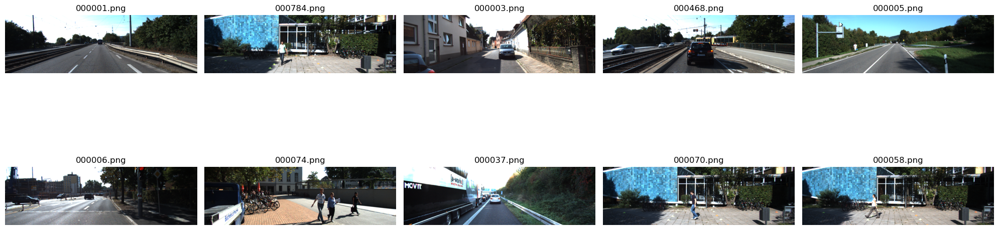

In [30]:
# 4. 실행 블록
test_image_paths = [
    'data/Kitti/raw/training/image_2/000001.png',
    'data/Kitti/raw/training/image_2/000784.png',
    'data/Kitti/raw/training/image_2/000003.png',
    'data/Kitti/raw/training/image_2/000468.png',
    'data/Kitti/raw/training/image_2/000005.png',
    'data/Kitti/raw/training/image_2/000006.png',
    'data/Kitti/raw/training/image_2/000074.png',
    'data/Kitti/raw/training/image_2/000037.png',
    'data/Kitti/raw/training/image_2/000070.png',
    'data/Kitti/raw/training/image_2/000058.png'
]

ground_truth_labels = [
    "Go", "Stop", "Go", "Stop", "Go", 
    "Go", "Stop", "Go", "Stop", "Stop"
]

fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.flatten() # 2차원 배열의 axes를 1차원으로 펴서 반복문에서 쓰기 쉽게 만듭니다.

print("📷 테스트 이미지 10장을 불러옵니다...")

for i, img_path in enumerate(test_image_paths):
    try:
        # 이미지 열기
        img = Image.open(img_path)
        
        # 이미지 출력
        axes[i].imshow(img)
        
        # 각 이미지 위에 파일명 출력 (예: 000001.png)
        axes[i].set_title(os.path.basename(img_path), fontsize=12)
        
        # 깔끔하게 보기 위해 x축, y축 눈금 숨기기
        axes[i].axis('off')
        
    except FileNotFoundError:
        print(f"❌ 파일을 찾을 수 없습니다: {img_path}")
        axes[i].set_title("File Not Found", color='red')
        axes[i].axis('off')

# 이미지들 사이의 간격 자동 조절
plt.tight_layout()
plt.show()

In [31]:
checkpoint_path = 'checkpoints/best.pth'  
custom_model, custom_decoder, custom_device = load_model(checkpoint_path)
test_system(test_image_paths, ground_truth_labels, custom_model, custom_decoder, custom_device)

모델 로드 완료: checkpoints/best.pth
   Epoch: 4, Loss: 0.3109

🚗 자율주행 보조 시스템 테스트를 시작합니다...
▶ [000001.png] ✅ 총 1개 객체 검출:
   - Car             | 점수: 0.42 | 크기:  21.3 x  36.8 px
결과: [01/10] ✅ PASS | 예측: Go   | 정답: Go  
--------------------------------------------------
▶ [000784.png] ✅ 총 1개 객체 검출:
   - Cyclist         | 점수: 0.30 | 크기:  20.1 x  62.2 px
결과: [02/10] ✅ PASS | 예측: Stop | 정답: Stop
--------------------------------------------------
▶ [000003.png] ✅ 총 2개 객체 검출:
   - Car             | 점수: 0.46 | 크기: 114.3 x 108.4 px
   - Van             | 점수: 0.36 | 크기: 111.3 x 111.2 px
결과: [03/10] ✅ PASS | 예측: Go   | 정답: Go  
--------------------------------------------------
▶ [000468.png] ✅ 총 5개 객체 검출:
   - Car             | 점수: 0.86 | 크기:  48.4 x  38.4 px
   - Car             | 점수: 0.65 | 크기: 119.5 x  74.3 px
   - Car             | 점수: 0.62 | 크기: 189.8 x 180.5 px
   - Car             | 점수: 0.44 | 크기:  32.1 x  30.8 px
   - Van             | 점수: 0.58 | 크기: 175.7 x 190.8 px
결과: [04/10] ✅ PASS | 예측: St

조건1: 사람이 있을 경우 stop
조건2: 차량이 가까이 있을 결루 stop
조건3: 조건1, 2에 해당하지 않을 경우 Go

결과1: 대부분의 이미지에서 사람을 검출하지 못하여 정답을 Stop이지만 Go라고 출력됨
결과2: 사람이 자전거에 탑승은 하지 않았지만 근처에 사람과 자전거가 있을 결루 Cyclist로 출력됨.
결과3: 차량이 가까이 있어 이미지에 해당하는 영역이 150픽셀(너비 또는 높이)에 해당할 경우 Stop로 잘 출력됨.

사람을 검출하니 못하는 경우를 확인할 필요가 있음.

In [32]:
import os
import torch
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
from torchvision import transforms

def analyze_and_show(image_path, model, decoder, device, threshold=0.3):
    print(f"\n🔍 [{os.path.basename(image_path)}] 이미지 분석 및 모델 속마음 확인")
    print("=" * 60)
    
    CLASSES = ['Car', 'Van', 'Truck', 'Pedestrian', 'Person_sitting', 'Cyclist', 'Tram', 'Misc']
    
    # 1. 이미지 로드 및 전처리
    image = Image.open(image_path).convert("RGB")
    original_size = image.size
    img_size = (384, 1280)
    
    transform = transforms.Compose([
        transforms.Resize(img_size),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    
    input_tensor = transform(image).unsqueeze(0).to(device)
    
    # 2. 모델 추론
    model.eval()
    with torch.no_grad():
        predictions = model(input_tensor)
        decoded = decoder(input_tensor, predictions)
        
    # ---------------------------------------------------------
    # 🖼️ [추가] 원본 이미지에 바운딩 박스 그리기 및 출력
    # ---------------------------------------------------------
    boxes, scores, classes = decoded[0]
    boxes = boxes.cpu().numpy()
    scores = scores.cpu().numpy()
    classes = classes.cpu().numpy()

    scale_w = img_size[1] / original_size[0]
    scale_h = img_size[0] / original_size[1]
    
    draw_image = image.copy()
    draw = ImageDraw.Draw(draw_image)
    
    valid_count = 0
    for box, score, cls_idx in zip(boxes, scores, classes):
        if score >= threshold:
            valid_count += 1
            class_name = CLASSES[cls_idx]
            
            # 스케일 복원
            x1 = box[0] / scale_w
            y1 = box[1] / scale_h
            x2 = box[2] / scale_w
            y2 = box[3] / scale_h
            
            # 박스 및 텍스트 그리기 (빨간색)
            draw.rectangle([x1, y1, x2, y2], outline="red", width=3)
            label = f"[{valid_count}] {class_name} {score:.2f}"
            
            # 텍스트 배경 그리기 (가독성 향상)
            draw.rectangle([x1, y1-15, x1+120, y1], fill="red")
            draw.text((x1+2, y1-15), label, fill="white")
    
    # Matplotlib을 사용하여 주피터 노트북 내에 이미지 출력
    plt.figure(figsize=(15, 6))
    plt.imshow(draw_image)
    plt.axis('off')
    plt.title(f"Detected Objects in {os.path.basename(image_path)}")
    plt.show()

    # ---------------------------------------------------------
    # 🧠 확률 분석 (보행자 vs 자전거 등)
    # ---------------------------------------------------------
    # 모델의 raw 로짓을 이용해 확률 계산
    cls_logits = predictions[0, :, 4:]
    cls_probs = torch.sigmoid(cls_logits)
    max_probs, max_classes = torch.max(cls_probs, dim=1)
    
    print("💡 [클래스 혼동 분석] 모델이 예측한 상위 객체들의 세부 확률:")
    top_k = min(3, len(cls_probs))
    top_probs, top_indices = torch.topk(max_probs, top_k)
    
    ped_idx = CLASSES.index('Pedestrian')
    cyc_idx = CLASSES.index('Cyclist')
    
    for i, anchor_idx in enumerate(top_indices):
        probs = cls_probs[anchor_idx]
        top3_p, top3_c = torch.topk(probs, 3)
        
        print(f"\n📍 앵커 {i+1} (최종 결정: {CLASSES[max_classes[anchor_idx]]})")
        for p, c in zip(top3_p, top3_c):
            print(f"   - {CLASSES[c]:<15}: {p.item()*100:>5.1f}%")
            
        print(f"   => ⚖️ [집중 분석] 보행자(Pedestrian): {probs[ped_idx]*100:.1f}%  VS  자전거(Cyclist): {probs[cyc_idx]*100:.1f}%")

🚀 10장의 이미지에 대한 연속 분석을 시작합니다...



################################################################################
  진행 상황: [01 / 10] - 파일명: 000001.png
################################################################################

🔍 [000001.png] 이미지 분석 및 모델 속마음 확인


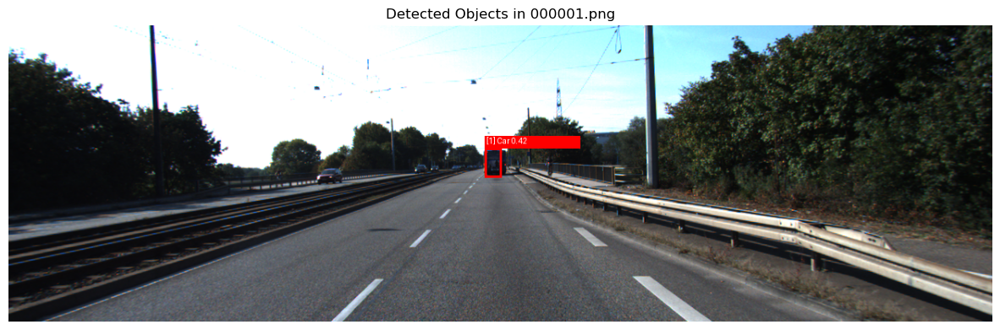

💡 [클래스 혼동 분석] 모델이 예측한 상위 객체들의 세부 확률:

📍 앵커 1 (최종 결정: Car)
   - Car            :  42.1%
   - Van            :  14.0%
   - Misc           :   7.6%
   => ⚖️ [집중 분석] 보행자(Pedestrian): 0.0%  VS  자전거(Cyclist): 1.6%

📍 앵커 2 (최종 결정: Car)
   - Car            :  40.1%
   - Van            :  16.3%
   - Misc           :   9.4%
   => ⚖️ [집중 분석] 보행자(Pedestrian): 0.1%  VS  자전거(Cyclist): 4.0%

📍 앵커 3 (최종 결정: Car)
   - Car            :  38.7%
   - Van            :  14.2%
   - Misc           :   5.2%
   => ⚖️ [집중 분석] 보행자(Pedestrian): 0.7%  VS  자전거(Cyclist): 4.2%


################################################################################
  진행 상황: [02 / 10] - 파일명: 000784.png
################################################################################

🔍 [000784.png] 이미지 분석 및 모델 속마음 확인


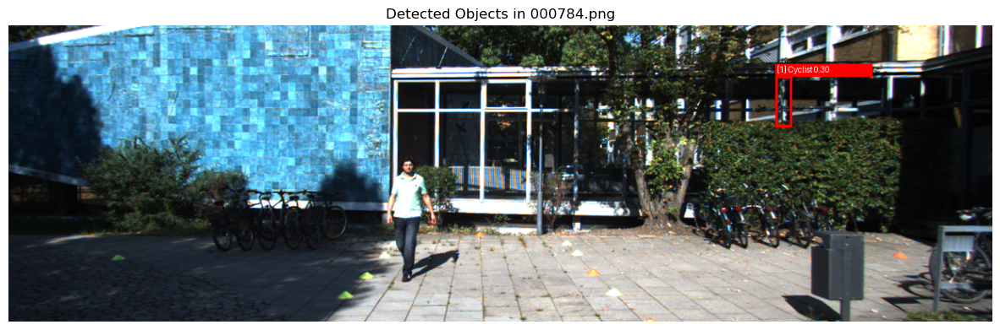

💡 [클래스 혼동 분석] 모델이 예측한 상위 객체들의 세부 확률:

📍 앵커 1 (최종 결정: Cyclist)
   - Cyclist        :  30.2%
   - Misc           :   8.9%
   - Pedestrian     :   5.3%
   => ⚖️ [집중 분석] 보행자(Pedestrian): 5.3%  VS  자전거(Cyclist): 30.2%

📍 앵커 2 (최종 결정: Cyclist)
   - Cyclist        :  28.3%
   - Misc           :   7.4%
   - Pedestrian     :   4.8%
   => ⚖️ [집중 분석] 보행자(Pedestrian): 4.8%  VS  자전거(Cyclist): 28.3%

📍 앵커 3 (최종 결정: Cyclist)
   - Cyclist        :  26.1%
   - Misc           :   7.0%
   - Pedestrian     :   6.4%
   => ⚖️ [집중 분석] 보행자(Pedestrian): 6.4%  VS  자전거(Cyclist): 26.1%


################################################################################
  진행 상황: [03 / 10] - 파일명: 000003.png
################################################################################

🔍 [000003.png] 이미지 분석 및 모델 속마음 확인


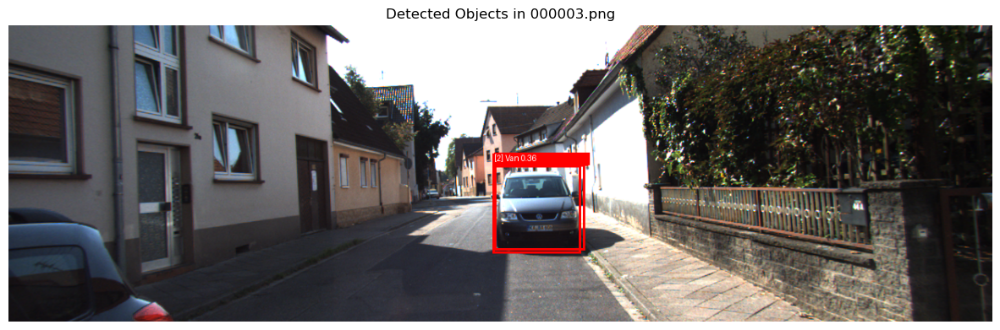

💡 [클래스 혼동 분석] 모델이 예측한 상위 객체들의 세부 확률:

📍 앵커 1 (최종 결정: Car)
   - Car            :  45.5%
   - Van            :  25.2%
   - Truck          :   1.3%
   => ⚖️ [집중 분석] 보행자(Pedestrian): 0.0%  VS  자전거(Cyclist): 0.0%

📍 앵커 2 (최종 결정: Van)
   - Van            :  35.6%
   - Car            :  26.8%
   - Misc           :   4.5%
   => ⚖️ [집중 분석] 보행자(Pedestrian): 0.0%  VS  자전거(Cyclist): 0.2%

📍 앵커 3 (최종 결정: Van)
   - Van            :  35.3%
   - Car            :  18.8%
   - Truck          :   5.1%
   => ⚖️ [집중 분석] 보행자(Pedestrian): 0.0%  VS  자전거(Cyclist): 0.3%


################################################################################
  진행 상황: [04 / 10] - 파일명: 000468.png
################################################################################

🔍 [000468.png] 이미지 분석 및 모델 속마음 확인


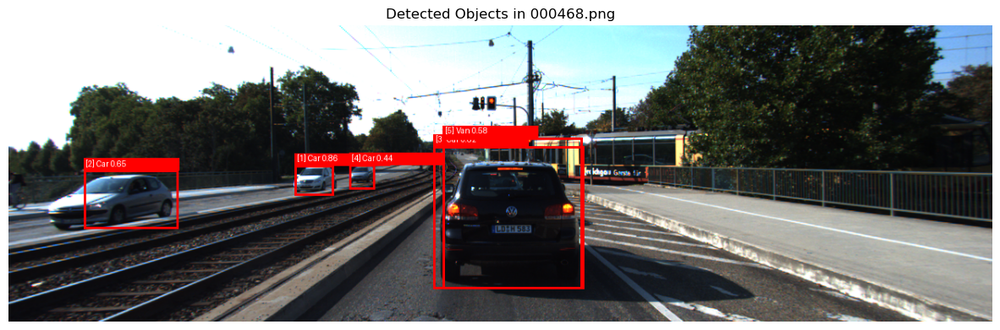

💡 [클래스 혼동 분석] 모델이 예측한 상위 객체들의 세부 확률:

📍 앵커 1 (최종 결정: Car)
   - Car            :  86.2%
   - Van            :   1.6%
   - Misc           :   0.9%
   => ⚖️ [집중 분석] 보행자(Pedestrian): 0.0%  VS  자전거(Cyclist): 0.0%

📍 앵커 2 (최종 결정: Car)
   - Car            :  83.0%
   - Van            :   2.0%
   - Misc           :   1.6%
   => ⚖️ [집중 분석] 보행자(Pedestrian): 0.0%  VS  자전거(Cyclist): 0.0%

📍 앵커 3 (최종 결정: Car)
   - Car            :  82.9%
   - Van            :   4.5%
   - Misc           :   1.0%
   => ⚖️ [집중 분석] 보행자(Pedestrian): 0.0%  VS  자전거(Cyclist): 0.0%


################################################################################
  진행 상황: [05 / 10] - 파일명: 000005.png
################################################################################

🔍 [000005.png] 이미지 분석 및 모델 속마음 확인


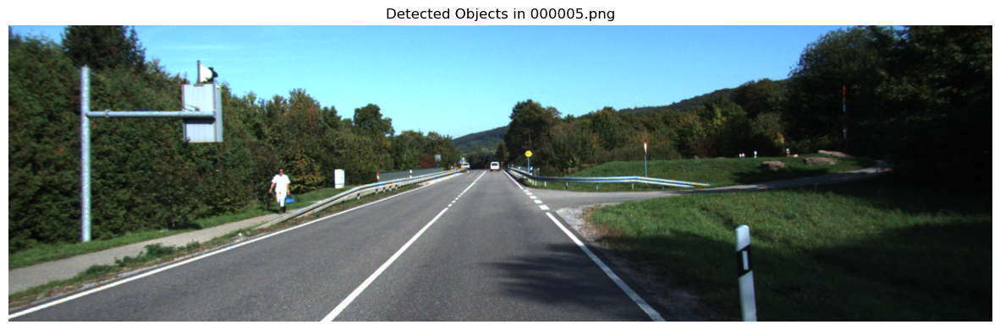

💡 [클래스 혼동 분석] 모델이 예측한 상위 객체들의 세부 확률:

📍 앵커 1 (최종 결정: Car)
   - Car            :  24.5%
   - Cyclist        :  16.1%
   - Misc           :  15.5%
   => ⚖️ [집중 분석] 보행자(Pedestrian): 2.4%  VS  자전거(Cyclist): 16.1%

📍 앵커 2 (최종 결정: Misc)
   - Misc           :  22.3%
   - Car            :  20.7%
   - Cyclist        :  10.5%
   => ⚖️ [집중 분석] 보행자(Pedestrian): 1.4%  VS  자전거(Cyclist): 10.5%

📍 앵커 3 (최종 결정: Misc)
   - Misc           :  22.3%
   - Car            :  18.8%
   - Cyclist        :   7.0%
   => ⚖️ [집중 분석] 보행자(Pedestrian): 1.7%  VS  자전거(Cyclist): 7.0%


################################################################################
  진행 상황: [06 / 10] - 파일명: 000006.png
################################################################################

🔍 [000006.png] 이미지 분석 및 모델 속마음 확인


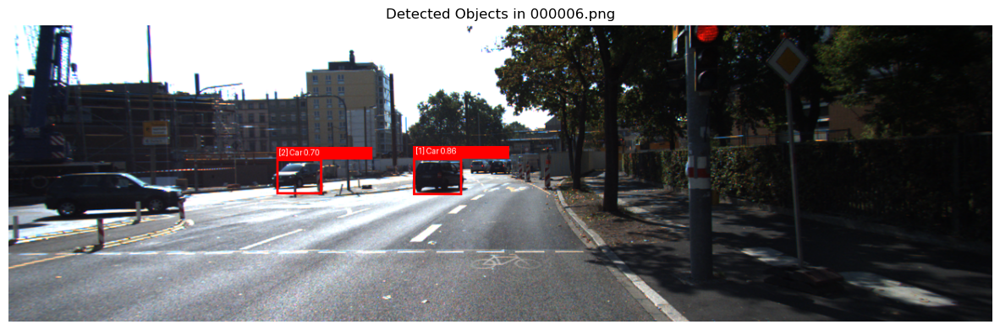

💡 [클래스 혼동 분석] 모델이 예측한 상위 객체들의 세부 확률:

📍 앵커 1 (최종 결정: Car)
   - Car            :  86.4%
   - Van            :   1.8%
   - Misc           :   0.6%
   => ⚖️ [집중 분석] 보행자(Pedestrian): 0.0%  VS  자전거(Cyclist): 0.0%

📍 앵커 2 (최종 결정: Car)
   - Car            :  84.5%
   - Van            :   3.1%
   - Misc           :   0.9%
   => ⚖️ [집중 분석] 보행자(Pedestrian): 0.0%  VS  자전거(Cyclist): 0.0%

📍 앵커 3 (최종 결정: Car)
   - Car            :  81.7%
   - Van            :  11.3%
   - Misc           :   3.9%
   => ⚖️ [집중 분석] 보행자(Pedestrian): 0.0%  VS  자전거(Cyclist): 0.0%


################################################################################
  진행 상황: [07 / 10] - 파일명: 000074.png
################################################################################

🔍 [000074.png] 이미지 분석 및 모델 속마음 확인


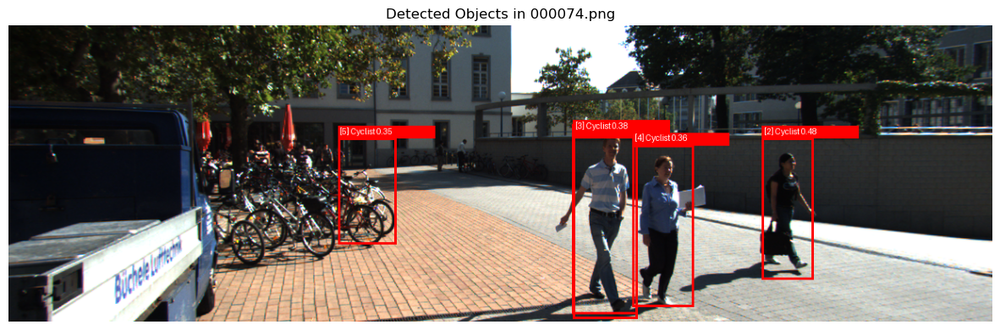

💡 [클래스 혼동 분석] 모델이 예측한 상위 객체들의 세부 확률:

📍 앵커 1 (최종 결정: Cyclist)
   - Cyclist        :  47.9%
   - Misc           :  18.6%
   - Person_sitting :  14.3%
   => ⚖️ [집중 분석] 보행자(Pedestrian): 8.6%  VS  자전거(Cyclist): 47.9%

📍 앵커 2 (최종 결정: Cyclist)
   - Cyclist        :  46.6%
   - Misc           :  19.6%
   - Person_sitting :  15.5%
   => ⚖️ [집중 분석] 보행자(Pedestrian): 9.1%  VS  자전거(Cyclist): 46.6%

📍 앵커 3 (최종 결정: Cyclist)
   - Cyclist        :  46.0%
   - Car            :  20.0%
   - Pedestrian     :  13.0%
   => ⚖️ [집중 분석] 보행자(Pedestrian): 13.0%  VS  자전거(Cyclist): 46.0%


################################################################################
  진행 상황: [08 / 10] - 파일명: 000037.png
################################################################################

🔍 [000037.png] 이미지 분석 및 모델 속마음 확인


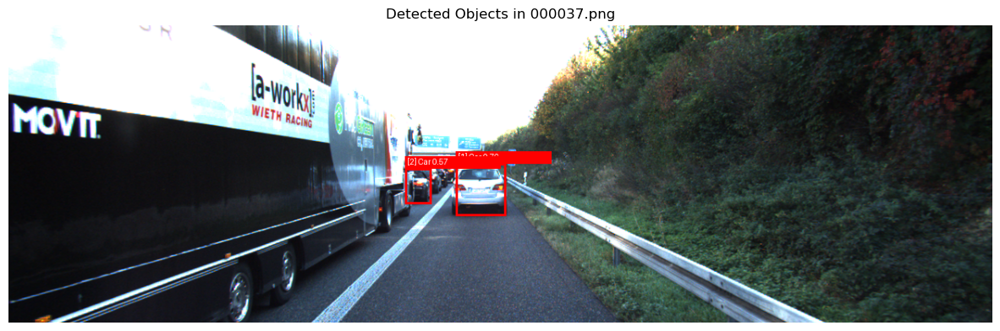

💡 [클래스 혼동 분석] 모델이 예측한 상위 객체들의 세부 확률:

📍 앵커 1 (최종 결정: Car)
   - Car            :  75.5%
   - Van            :   7.2%
   - Misc           :   3.5%
   => ⚖️ [집중 분석] 보행자(Pedestrian): 0.0%  VS  자전거(Cyclist): 0.9%

📍 앵커 2 (최종 결정: Car)
   - Car            :  75.4%
   - Van            :   5.9%
   - Misc           :   2.0%
   => ⚖️ [집중 분석] 보행자(Pedestrian): 0.0%  VS  자전거(Cyclist): 0.0%

📍 앵커 3 (최종 결정: Car)
   - Car            :  68.9%
   - Van            :   9.5%
   - Misc           :   3.7%
   => ⚖️ [집중 분석] 보행자(Pedestrian): 0.0%  VS  자전거(Cyclist): 0.4%


################################################################################
  진행 상황: [09 / 10] - 파일명: 000070.png
################################################################################

🔍 [000070.png] 이미지 분석 및 모델 속마음 확인


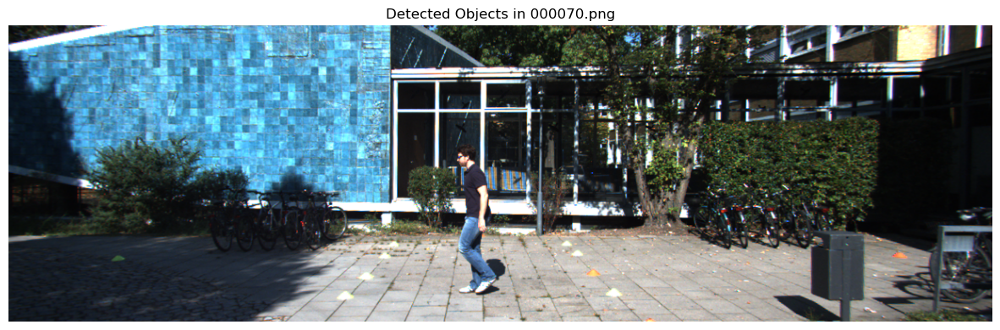

💡 [클래스 혼동 분석] 모델이 예측한 상위 객체들의 세부 확률:

📍 앵커 1 (최종 결정: Cyclist)
   - Cyclist        :  22.9%
   - Pedestrian     :  11.6%
   - Misc           :  10.7%
   => ⚖️ [집중 분석] 보행자(Pedestrian): 11.6%  VS  자전거(Cyclist): 22.9%

📍 앵커 2 (최종 결정: Cyclist)
   - Cyclist        :  22.5%
   - Misc           :   9.9%
   - Pedestrian     :   8.9%
   => ⚖️ [집중 분석] 보행자(Pedestrian): 8.9%  VS  자전거(Cyclist): 22.5%

📍 앵커 3 (최종 결정: Cyclist)
   - Cyclist        :  21.3%
   - Misc           :   5.2%
   - Pedestrian     :   4.7%
   => ⚖️ [집중 분석] 보행자(Pedestrian): 4.7%  VS  자전거(Cyclist): 21.3%


################################################################################
  진행 상황: [10 / 10] - 파일명: 000058.png
################################################################################

🔍 [000058.png] 이미지 분석 및 모델 속마음 확인


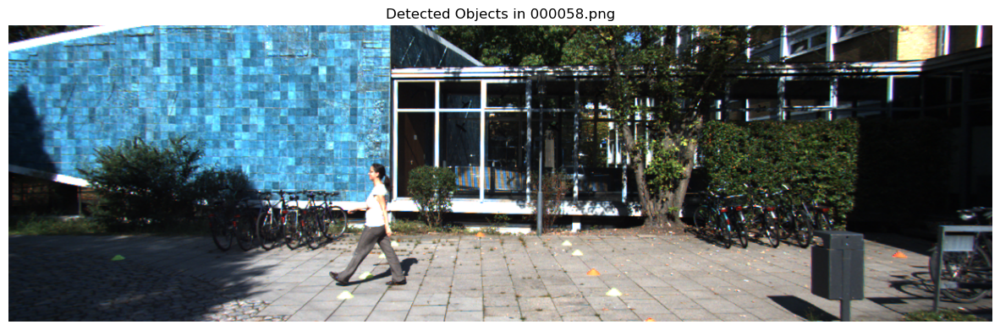

💡 [클래스 혼동 분석] 모델이 예측한 상위 객체들의 세부 확률:

📍 앵커 1 (최종 결정: Cyclist)
   - Cyclist        :   6.5%
   - Person_sitting :   4.0%
   - Misc           :   2.8%
   => ⚖️ [집중 분석] 보행자(Pedestrian): 2.7%  VS  자전거(Cyclist): 6.5%

📍 앵커 2 (최종 결정: Cyclist)
   - Cyclist        :   6.1%
   - Person_sitting :   5.1%
   - Pedestrian     :   3.2%
   => ⚖️ [집중 분석] 보행자(Pedestrian): 3.2%  VS  자전거(Cyclist): 6.1%

📍 앵커 3 (최종 결정: Cyclist)
   - Cyclist        :   6.0%
   - Person_sitting :   3.4%
   - Pedestrian     :   2.8%
   => ⚖️ [집중 분석] 보행자(Pedestrian): 2.8%  VS  자전거(Cyclist): 6.0%


In [33]:
# 10장의 테스트 이미지 경로 리스트
test_image_paths = [
    'data/Kitti/raw/training/image_2/000001.png',
    'data/Kitti/raw/training/image_2/000784.png',
    'data/Kitti/raw/training/image_2/000003.png',
    'data/Kitti/raw/training/image_2/000468.png',
    'data/Kitti/raw/training/image_2/000005.png',
    'data/Kitti/raw/training/image_2/000006.png',
    'data/Kitti/raw/training/image_2/000074.png',
    'data/Kitti/raw/training/image_2/000037.png',
    'data/Kitti/raw/training/image_2/000070.png',
    'data/Kitti/raw/training/image_2/000058.png'
]

print("🚀 10장의 이미지에 대한 연속 분석을 시작합니다...\n")

# 반복문을 통해 10장 모두 분석 함수 호출
for i, img_path in enumerate(test_image_paths):
    try:
        print(f"\n\n{'#' * 80}")
        print(f"  진행 상황: [{i+1:02d} / 10] - 파일명: {os.path.basename(img_path)}")
        print(f"{'#' * 80}")
        
        # 분석 및 시각화 함수 호출
        # (임계값이 너무 높아서 안 보인다면 threshold=0.2 등으로 조절 가능)
        analyze_and_show(img_path, custom_model, custom_decoder, custom_device, threshold=0.3)
        
    except FileNotFoundError:
        print(f"❌ 파일을 찾을 수 없습니다: {img_path}\n경로를 다시 확인해주세요.")

자동차에 대해서 검출은 어느정도 하지만 사람에 대한 검출은 많이 부족한 것으로 확인된다. 이는 KITTY 데이터셋에서 자동차의 비율이 더 많은 것 때문일 것 같다.

In [ ]:
import torch
import torch.optim as optim
from torch.optim.lr_scheduler import LambdaLR
from tqdm import tqdm
import os
import gc

# ==========================================
# 🛡️ [안전장치] GPU 메모리 상태 점검 및 강제 초기화
# ==========================================
gc.collect()
torch.cuda.empty_cache()

allocated = torch.cuda.memory_allocated() / (1024 ** 3)
reserved = torch.cuda.memory_reserved() / (1024 ** 3)
print(f"📊 현재 할당된 GPU 메모리: {allocated:.2f} GB")
print(f"📊 현재 예약된 GPU 메모리: {reserved:.2f} GB")

if allocated > 2.0:
    print("⚠️ 경고: 여전히 GPU 메모리가 차 있습니다! 커널 재시작 후 과거 학습 셀을 건너뛰었는지 확인하세요.")
else:
    print("✨ GPU 메모리가 쾌적합니다. 실험을 시작합니다!\n")
# ==========================================

print("🧪 [Ablation Study: Exp 1] Focal Loss Gamma = 3.0 실험을 시작합니다...")

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# 1. 모델 초기화
backbone_exp = get_resnet50_backbone(pretrained=True)
model_exp = RetinaNet(num_classes=8, backbone=backbone_exp)
model_exp = model_exp.to(device)

# 2. Focal Loss Gamma 3.0 설정
loss_fn_exp = RetinaNetLoss(num_classes=8, alpha=0.25, gamma=3.0, delta=1.0)
label_encoder = LabelEncoder()

# 3. Optimizer
optimizer_exp = optim.SGD(model_exp.parameters(), lr=1e-3, momentum=0.9, weight_decay=1e-4)

def lr_lambda(epoch):
    return 1.0 if epoch < 3 else 0.1
scheduler_exp = LambdaLR(optimizer_exp, lr_lambda=lr_lambda)

# AMP 활성화 (메모리 50% 절약)
scaler = torch.amp.GradScaler('cuda')

# 4. 학습 루프
num_epochs_exp = 5
best_loss_exp = float('inf')
checkpoint_path_exp = 'checkpoints/ablation_gamma3.pth'
os.makedirs('checkpoints', exist_ok=True)

for epoch in range(num_epochs_exp):
    model_exp.train()
    running_loss = 0.0
    
    # 매 에폭 시작 시 찌꺼기 메모리 비우기
    torch.cuda.empty_cache()
    
    progress_bar = tqdm(train_loader, desc=f'Exp Epoch {epoch+1}/{num_epochs_exp}')
    
    for batch_idx, (images, targets) in enumerate(progress_bar):
        images = images.to(device)
        
        boxes = [t['boxes'] for t in targets]
        labels = [t['labels'] for t in targets]
        encoded_targets = label_encoder.encode_batch(images, boxes, labels)
        
        optimizer_exp.zero_grad(set_to_none=True)
        
        with torch.amp.autocast('cuda'):
            predictions = model_exp(images)
            loss = loss_fn_exp(encoded_targets, predictions)
        
        scaler.scale(loss).backward()
        
        scaler.unscale_(optimizer_exp)
        torch.nn.utils.clip_grad_norm_(model_exp.parameters(), max_norm=2.0)
        
        scaler.step(optimizer_exp)
        scaler.update()
        
        running_loss += loss.item()
        
        progress_bar.set_postfix({
            'loss': f'{loss.item():.4f}',
            'avg_loss': f'{running_loss / (batch_idx + 1):.4f}'
        })
        
    scheduler_exp.step()
    avg_loss = running_loss / len(train_loader)
    print(f"👉 Epoch {epoch+1} Average Loss: {avg_loss:.4f}")
    
    if avg_loss < best_loss_exp:
        best_loss_exp = avg_loss
        torch.save({
            'epoch': epoch,
            'model_state_dict': model_exp.state_dict(),
            'loss': avg_loss,
        }, checkpoint_path_exp)
        print(f"   🌟 Best model saved to {checkpoint_path_exp}!")

print("✅ 학습이 완료되었습니다!")

📊 현재 할당된 GPU 메모리: 0.28 GB
📊 현재 예약된 GPU 메모리: 0.39 GB
✨ GPU 메모리가 쾌적합니다. 실험을 시작합니다!

🧪 [Ablation Study: Exp 1] Focal Loss Gamma = 3.0 실험을 시작합니다...


Exp Epoch 1/5:   9%|▉         | 164/1871 [01:31<15:44,  1.81it/s, loss=3.9218, avg_loss=3.8652]